In [1]:
import pandas as pd
import numpy as np
import os
import sys
import re
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
from Bio.Alphabet import IUPAC
from matplotlib_venn import venn2
from matplotlib_venn import venn3
from linage import get_lineage_coll
from resistance import get_resistance_snp

In [5]:
def import_VCF42_to_pandas(vcf_file, sep='\t'):
    header_lines = 0
    with open(vcf_file) as f:
        first_line = f.readline().strip()
        next_line = f.readline().strip()
        while next_line.startswith("##"):
            header_lines = header_lines + 1
            #print(next_line)
            next_line = f.readline()
    
    if first_line.endswith('VCFv4.2'):
        
        #Use first line as header
        dataframe = pd.read_csv(vcf_file, sep=sep, skiprows=[header_lines], header=header_lines)
        sample = dataframe.columns[-1]
        dataframe.rename(columns={sample:'sample'}, inplace=True)
        
        for index in dataframe.index:
            info_fields = re.findall(r';*([a-zA-Z]{1,20})=', dataframe.loc[index,'INFO'])
            info_values = re.findall(r'-?\d+\.?\d*e?[+-]?\d{0,2}', dataframe.loc[index,'INFO'])
            
            format_fields = dataframe.loc[index,'FORMAT'].split(":")
            format_values = dataframe.loc[index,'sample'].split(":")
                                    
            for ifield, ivalue in zip(info_fields,info_values):
                dataframe.loc[index,ifield] = ivalue
                
            for ffield, fvalue in zip(format_fields,format_values):
                dataframe.loc[index,ffield] = fvalue
            #if len(format_values[1].split(",")) != 2:
            #    print(format_values[1].split(","), index)
            #    print(dataframe.iloc[index])
        dataframe.rename(columns={'AF':'af'}, inplace=True)
        dataframe['REF_AD'] = dataframe['AD'].str.split(",").str[-2:].str[0]
        dataframe['ALT_AD'] = dataframe['AD'].str.split(",").str[-2:].str[1]
        
        to_float = ['POS', 'QUAL', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'MLEAC', 'MLEAF', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR','GQ','ALT_AD', 'REF_AD']
        
        for column in dataframe.columns:
            if column in to_float:
                dataframe[column] = dataframe[column].astype(float)
        
        dataframe['aF'] = dataframe['REF_AD']/dataframe['DP']
        dataframe['AF'] = dataframe['ALT_AD']/dataframe['DP']

                
    else:
        print("This vcf file is not v4.2")
        sys.exit(1)
           
    return dataframe

In [6]:
vcf_1 = 'test/1mixed.snp.hf.vcf'
vcf_2 = 'test/2mixed.snp.hf.vcf'
vcf_3 = 'test/3mixed.snp.hf.vcf'
vcf_4 = 'test/4mixed.snp.hf.vcf'
vcf_5 = 'test/5mixed.snp.hf.vcf'

vcf_files = [vcf_1, vcf_2, vcf_3, vcf_4, vcf_5]

#reference="data/MTB_ancestorII_reference.fas"

#fasta_to_replace = SeqIO.read(reference,"fasta")

sample_list = ["1", "2", "3", "4", "5"]
sample_list_df_name = [sample + "_df" for sample in sample_list]

dict_df = {}
for vcf, df_name in zip(vcf_files, sample_list_df_name):
    dict_df[df_name] = import_VCF42_to_pandas(vcf)
    
#P150_df = import_VCF4_to_pandas(vcf_P150)
#P180_df = import_VCF4_to_pandas(vcf_P180)
#P190_df = import_VCF4_to_pandas(vcf_P190)


#new_reference_seq = replace_fasta_sequence(reference,P150_df['REF'],P150_df['ALT'],P150_df['POS'])
#new_reference_id = "%s_%s" % (fasta_to_replace.id, sample_name)

#Output_new_reference = "Ancestor_PAIR15050.fasta"

#Create seqIO object
#new_reference = SeqRecord(Seq(new_reference_seq), id = new_reference_id, description = "")


#with open(Output_new_reference, "w") as output_handle:
#    SeqIO.write(new_reference, output_handle, "fasta")
#df_1 = import_VCF4_to_pandas(vcf_1)

In [7]:
print(sample_list_df_name)
print(vcf_files)

['1_df', '2_df', '3_df', '4_df', '5_df']
['test/1mixed.snp.hf.vcf', 'test/2mixed.snp.hf.vcf', 'test/3mixed.snp.hf.vcf', 'test/4mixed.snp.hf.vcf', 'test/5mixed.snp.hf.vcf']


In [8]:
#print(fasta_to_replace.seq[0:41])

In [9]:
#print(new_reference_seq[0:41])

In [10]:
dict_df["1_df"].head(10)

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,...,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,REF_AD,ALT_AD,aF,AF
0,MTB_anc,2532.0,.,C,T,921.03,PASS,AC=2;AF=1.00;AN=2;DP=29;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,29:29:87:935,87,0",...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,0.000000,1.000000
1,MTB_anc,8049.0,.,T,G,1319.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.873;DP=74;Ex...,GT:AD:DP:GQ:PL,"0/1:30,44:74:99:1327,0,793",...,0.873,0.0,-0.149,NaN,NaN,NaN,30.0,44.0,0.405405,0.594595
2,MTB_anc,8688.0,.,G,T,784.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.87;DP=73;Exc...,GT:AD:DP:GQ:PL,"0/1:45,28:73:99:792,0,1301",...,1.870,0.0,-0.562,NaN,NaN,NaN,45.0,28.0,0.616438,0.383562
3,MTB_anc,9143.0,.,C,T,3478.03,PASS,AC=2;AF=1.00;AN=2;DP=106;ExcessHet=3.0103;FS=0...,GT:AD:DP:GQ:PL,"1/1:0,106:106:99:3492,318,0",...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,106.0,0.000000,1.000000
4,MTB_anc,9841.0,.,C,T,1034.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.148;DP=121;E...,GT:AD:DP:GQ:PL,"0/1:77,44:121:99:1042,0,2063",...,0.148,0.0,-1.976,NaN,NaN,NaN,77.0,44.0,0.636364,0.363636
5,MTB_anc,9944.0,.,A,C,706.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.638;DP=92;Ex...,GT:AD:DP:GQ:PL,"0/1:62,30:92:99:714,0,1791",...,0.638,0.0,0.104,NaN,NaN,NaN,62.0,30.0,0.673913,0.326087
6,MTB_anc,12833.0,.,C,G,1372.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.64;DP=65;Exc...,GT:AD:DP:GQ:PL,"0/1:19,46:65:99:1380,0,390",...,1.640,0.0,-0.577,NaN,NaN,NaN,19.0,46.0,0.292308,0.707692
7,MTB_anc,13460.0,.,G,A,1933.03,PASS,AC=2;AF=1.00;AN=2;DP=66;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,65:65:99:1947,192,0",...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,65.0,0.000000,1.000000
8,MTB_anc,13965.0,.,C,G,592.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.11;DP=58;Exc...,GT:AD:DP:GQ:PL,"0/1:32,26:58:99:600,0,681",...,1.110,0.0,-0.227,NaN,NaN,NaN,32.0,26.0,0.551724,0.448276
9,MTB_anc,14401.0,.,G,A,3387.03,PASS,AC=2;AF=1.00;AN=2;DP=101;ExcessHet=3.0103;FS=0...,GT:AD:DP:GQ:PL,"1/1:0,101:101:99:3401,302,0",...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,101.0,0.000000,1.000000


In [11]:
dict_df["1_df"].dtypes

#CHROM             object
POS               float64
ID                 object
REF                object
ALT                object
QUAL              float64
FILTER             object
INFO               object
FORMAT             object
sample             object
AC                float64
af                float64
AN                float64
DP                float64
ExcessHet         float64
FS                float64
MLEAC             float64
MLEAF             float64
MQ                float64
QD                float64
SOR               float64
GT                 object
AD                 object
GQ                float64
PL                 object
BaseQRankSum      float64
MQRankSum         float64
ReadPosRankSum    float64
PGT                object
PID                object
PS                 object
REF_AD            float64
ALT_AD            float64
aF                float64
AF                float64
dtype: object

In [12]:
dict_df["1_df"].head(5)

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,...,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,REF_AD,ALT_AD,aF,AF
0,MTB_anc,2532.0,.,C,T,921.03,PASS,AC=2;AF=1.00;AN=2;DP=29;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,29:29:87:935,87,0",...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,0.000000,1.000000
1,MTB_anc,8049.0,.,T,G,1319.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.873;DP=74;Ex...,GT:AD:DP:GQ:PL,"0/1:30,44:74:99:1327,0,793",...,0.873,0.0,-0.149,NaN,NaN,NaN,30.0,44.0,0.405405,0.594595
2,MTB_anc,8688.0,.,G,T,784.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.87;DP=73;Exc...,GT:AD:DP:GQ:PL,"0/1:45,28:73:99:792,0,1301",...,1.870,0.0,-0.562,NaN,NaN,NaN,45.0,28.0,0.616438,0.383562
3,MTB_anc,9143.0,.,C,T,3478.03,PASS,AC=2;AF=1.00;AN=2;DP=106;ExcessHet=3.0103;FS=0...,GT:AD:DP:GQ:PL,"1/1:0,106:106:99:3492,318,0",...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,106.0,0.000000,1.000000
4,MTB_anc,9841.0,.,C,T,1034.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.148;DP=121;E...,GT:AD:DP:GQ:PL,"0/1:77,44:121:99:1042,0,2063",...,0.148,0.0,-1.976,NaN,NaN,NaN,77.0,44.0,0.636364,0.363636


In [13]:
#Function to draw distplot with seaborn
def distplot_sns(data_frame_vcf):
    x = data_frame_vcf['AF']
    sns.distplot(x, kde=False, rug=False)
    plt.show()

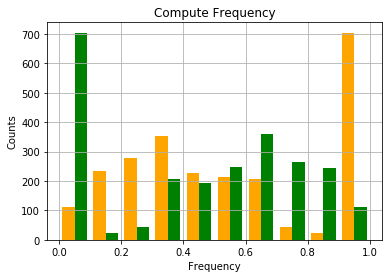

In [14]:
x = dict_df["1_df"]['AF']
reference = 1 - dict_df["1_df"]['AF']

plt.xlabel('Frequency')
plt.ylabel('Counts')
plt.title('Compute Frequency')
plt.grid(True)

plt.hist([x, reference], color=['orange', 'green']) 
plt.show()

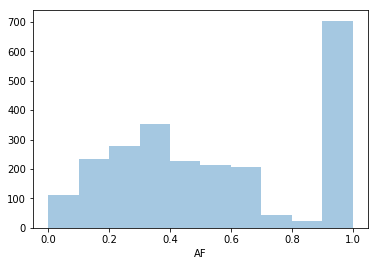

In [15]:
x = dict_df["1_df"]['AF']
espejo = 1 - dict_df["1_df"]['AF']

sns.distplot(x, kde=False, rug=False)
#sns.distplot(espejo, kde=False, rug=False)

In [16]:
dict_df["1_df"]['AF'].mean(axis = 0) 

0.5597808806751288

In [17]:
def scatter_vcf(vcf_df):
    filter_value = 0.98
    y = vcf_df['AF'][vcf_df['AF'] < filter_value]
    x = vcf_df['AF'][vcf_df['AF'] < filter_value].index.values
    
    mean = vcf_df['AF'].mean(axis = 0)
    
    col_mean = np.where(vcf_df['AF'][vcf_df['AF'] < filter_value] > mean,'c','r')
    
    plt.figure(figsize=(50,20))
    plt.margins(x=0.01, y=0.01, tight=True)

    plt.xlabel('Frequency')
    plt.ylabel('Counts')
    plt.title('Compute Frequency')
    plt.grid(True)
    

    plt.scatter(x, y, color=col_mean, alpha=0.5, s=200) # colormap='jet'
    plt.show()
    

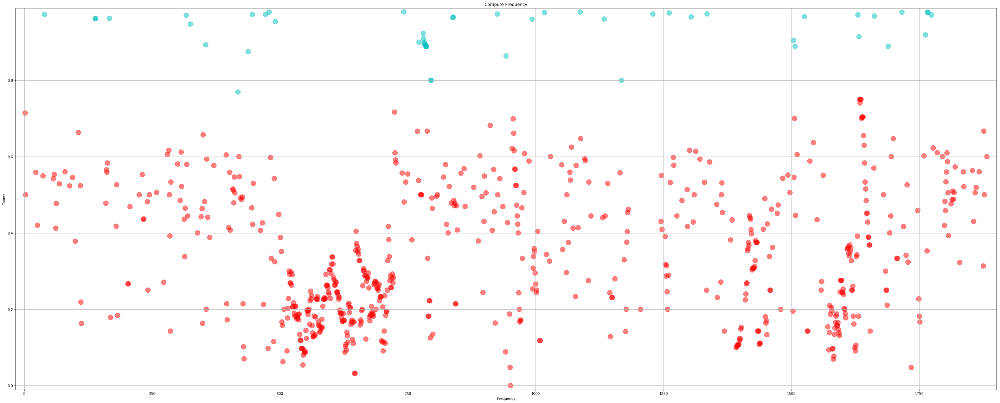

In [18]:
scatter_vcf(dict_df["5_df"])

# FILTER REPEATS

In [19]:
list_positions = []
with open("data/repeats_annot.coords.tab") as f:
    for _ in range(1):
        next(f)
    for line in f:
        split_line = line.strip().split("\t")
        expression = "((row['POS'] >= %s) & (row['POS'] <= %s))" % (split_line[0], split_line[1])
        list_positions.append(expression)
print("(" + "|".join(list_positions) + ")")

(((row['POS'] >= 33582 ) & (row['POS'] <=  33794))|((row['POS'] >= 103710 ) & (row['POS'] <=  104663))|((row['POS'] >= 104805 ) & (row['POS'] <=  105215))|((row['POS'] >= 105324 ) & (row['POS'] <=  106715))|((row['POS'] >= 131382 ) & (row['POS'] <=  132872))|((row['POS'] >= 149533 ) & (row['POS'] <=  150996))|((row['POS'] >= 177543 ) & (row['POS'] <=  179309))|((row['POS'] >= 179319 ) & (row['POS'] <=  180896))|((row['POS'] >= 187433 ) & (row['POS'] <=  188839))|((row['POS'] >= 188931 ) & (row['POS'] <=  190439))|((row['POS'] >= 307877 ) & (row['POS'] <=  309547))|((row['POS'] >= 333437 ) & (row['POS'] <=  336310))|((row['POS'] >= 336560 ) & (row['POS'] <=  339073))|((row['POS'] >= 339364 ) & (row['POS'] <=  340974))|((row['POS'] >= 349624 ) & (row['POS'] <=  349932))|((row['POS'] >= 349935 ) & (row['POS'] <=  351476))|((row['POS'] >= 361334 ) & (row['POS'] <=  363109))|((row['POS'] >= 366150 ) & (row['POS'] <=  372764))|((row['POS'] >= 372820 ) & (row['POS'] <=  375711))|((row['POS'] 

In [20]:
def filter_repeats(row):
    if ((row['POS'] >= 33582 ) & (row['POS'] <=  33794))|((row['POS'] >= 103710 ) & (row['POS'] <=  104663))|((row['POS'] >= 104805 ) & (row['POS'] <=  105215))|((row['POS'] >= 105324 ) & (row['POS'] <=  106715))|((row['POS'] >= 131382 ) & (row['POS'] <=  132872))|((row['POS'] >= 149533 ) & (row['POS'] <=  150996))|((row['POS'] >= 177543 ) & (row['POS'] <=  179309))|((row['POS'] >= 179319 ) & (row['POS'] <=  180896))|((row['POS'] >= 187433 ) & (row['POS'] <=  188839))|((row['POS'] >= 188931 ) & (row['POS'] <=  190439))|((row['POS'] >= 307877 ) & (row['POS'] <=  309547))|((row['POS'] >= 333437 ) & (row['POS'] <=  336310))|((row['POS'] >= 336560 ) & (row['POS'] <=  339073))|((row['POS'] >= 339364 ) & (row['POS'] <=  340974))|((row['POS'] >= 349624 ) & (row['POS'] <=  349932))|((row['POS'] >= 349935 ) & (row['POS'] <=  351476))|((row['POS'] >= 361334 ) & (row['POS'] <=  363109))|((row['POS'] >= 366150 ) & (row['POS'] <=  372764))|((row['POS'] >= 372820 ) & (row['POS'] <=  375711))|((row['POS'] >= 399535 ) & (row['POS'] <=  400050))|((row['POS'] >= 400192 ) & (row['POS'] <=  401703))|((row['POS'] >= 424269 ) & (row['POS'] <=  424694))|((row['POS'] >= 424777 ) & (row['POS'] <=  434679))|((row['POS'] >= 466672 ) & (row['POS'] <=  467406))|((row['POS'] >= 467459 ) & (row['POS'] <=  468001))|((row['POS'] >= 472781 ) & (row['POS'] <=  474106))|((row['POS'] >= 475816 ) & (row['POS'] <=  476184))|((row['POS'] >= 530751 ) & (row['POS'] <=  532214))|((row['POS'] >= 543174 ) & (row['POS'] <=  544730))|((row['POS'] >= 606551 ) & (row['POS'] <=  608062))|((row['POS'] >= 622793 ) & (row['POS'] <=  624577))|((row['POS'] >= 671996 ) & (row['POS'] <=  675916))|((row['POS'] >= 832534 ) & (row['POS'] <=  832848))|((row['POS'] >= 832981 ) & (row['POS'] <=  833508))|((row['POS'] >= 835701 ) & (row['POS'] <=  838052))|((row['POS'] >= 838451 ) & (row['POS'] <=  840856))|((row['POS'] >= 846159 ) & (row['POS'] <=  847913))|((row['POS'] >= 848103 ) & (row['POS'] <=  850040))|((row['POS'] >= 850342 ) & (row['POS'] <=  850527))|((row['POS'] >= 889072 ) & (row['POS'] <=  889398))|((row['POS'] >= 889395 ) & (row['POS'] <=  890333))|((row['POS'] >= 890388 ) & (row['POS'] <=  891482))|((row['POS'] >= 924951 ) & (row['POS'] <=  925364))|((row['POS'] >= 925361 ) & (row['POS'] <=  927610))|((row['POS'] >= 927837 ) & (row['POS'] <=  930485))|((row['POS'] >= 947312 ) & (row['POS'] <=  947644))|((row['POS'] >= 968424 ) & (row['POS'] <=  970244))|((row['POS'] >= 976872 ) & (row['POS'] <=  978203))|((row['POS'] >= 1020058 ) & (row['POS'] <=  1021329))|((row['POS'] >= 1021344 ) & (row['POS'] <=  1021643))|((row['POS'] >= 1025497 ) & (row['POS'] <=  1026816))|((row['POS'] >= 1027104 ) & (row['POS'] <=  1027685))|((row['POS'] >= 1027685 ) & (row['POS'] <=  1029337))|((row['POS'] >= 1090373 ) & (row['POS'] <=  1093144))|((row['POS'] >= 1093361 ) & (row['POS'] <=  1094356))|((row['POS'] >= 1095078 ) & (row['POS'] <=  1096451))|((row['POS'] >= 1158918 ) & (row['POS'] <=  1159307))|((row['POS'] >= 1159375 ) & (row['POS'] <=  1160061))|((row['POS'] >= 1161297 ) & (row['POS'] <=  1162472))|((row['POS'] >= 1162549 ) & (row['POS'] <=  1163376))|((row['POS'] >= 1164572 ) & (row['POS'] <=  1165435))|((row['POS'] >= 1165092 ) & (row['POS'] <=  1165499))|((row['POS'] >= 1169423 ) & (row['POS'] <=  1170670))|((row['POS'] >= 1176928 ) & (row['POS'] <=  1177242))|((row['POS'] >= 1188421 ) & (row['POS'] <=  1190424))|((row['POS'] >= 1190757 ) & (row['POS'] <=  1192148))|((row['POS'] >= 1211560 ) & (row['POS'] <=  1213863))|((row['POS'] >= 1214513 ) & (row['POS'] <=  1214947))|((row['POS'] >= 1214769 ) & (row['POS'] <=  1215131))|((row['POS'] >= 1216469 ) & (row['POS'] <=  1219030))|((row['POS'] >= 1251617 ) & (row['POS'] <=  1252972))|((row['POS'] >= 1262272 ) & (row['POS'] <=  1264128))|((row['POS'] >= 1276300 ) & (row['POS'] <=  1277748))|((row['POS'] >= 1277893 ) & (row['POS'] <=  1278300))|((row['POS'] >= 1298764 ) & (row['POS'] <=  1299804))|((row['POS'] >= 1299822 ) & (row['POS'] <=  1300124))|((row['POS'] >= 1301755 ) & (row['POS'] <=  1302681))|((row['POS'] >= 1339003 ) & (row['POS'] <=  1339302))|((row['POS'] >= 1339349 ) & (row['POS'] <=  1340524))|((row['POS'] >= 1341358 ) & (row['POS'] <=  1342605))|((row['POS'] >= 1357293 ) & (row['POS'] <=  1357625))|((row['POS'] >= 1384989 ) & (row['POS'] <=  1386677))|((row['POS'] >= 1468171 ) & (row['POS'] <=  1469505))|((row['POS'] >= 1488154 ) & (row['POS'] <=  1489965))|((row['POS'] >= 1532443 ) & (row['POS'] <=  1533633))|((row['POS'] >= 1541994 ) & (row['POS'] <=  1542878))|((row['POS'] >= 1542929 ) & (row['POS'] <=  1543255))|((row['POS'] >= 1561464 ) & (row['POS'] <=  1561772))|((row['POS'] >= 1561769 ) & (row['POS'] <=  1563388))|((row['POS'] >= 1572127 ) & (row['POS'] <=  1573857))|((row['POS'] >= 1606386 ) & (row['POS'] <=  1607972))|((row['POS'] >= 1618209 ) & (row['POS'] <=  1619684))|((row['POS'] >= 1630638 ) & (row['POS'] <=  1634627))|((row['POS'] >= 1636004 ) & (row['POS'] <=  1638229))|((row['POS'] >= 1655609 ) & (row['POS'] <=  1656721))|((row['POS'] >= 1751297 ) & (row['POS'] <=  1753333))|((row['POS'] >= 1779194 ) & (row['POS'] <=  1779298))|((row['POS'] >= 1779314 ) & (row['POS'] <=  1779724))|((row['POS'] >= 1779930 ) & (row['POS'] <=  1780241))|((row['POS'] >= 1780199 ) & (row['POS'] <=  1780699))|((row['POS'] >= 1780643 ) & (row['POS'] <=  1782064))|((row['POS'] >= 1782072 ) & (row['POS'] <=  1782584))|((row['POS'] >= 1782758 ) & (row['POS'] <=  1783228))|((row['POS'] >= 1783309 ) & (row['POS'] <=  1783623))|((row['POS'] >= 1783620 ) & (row['POS'] <=  1783892))|((row['POS'] >= 1783906 ) & (row['POS'] <=  1784301))|((row['POS'] >= 1784497 ) & (row['POS'] <=  1785912))|((row['POS'] >= 1785912 ) & (row['POS'] <=  1786310))|((row['POS'] >= 1786307 ) & (row['POS'] <=  1786528))|((row['POS'] >= 1786584 ) & (row['POS'] <=  1787099))|((row['POS'] >= 1787096 ) & (row['POS'] <=  1788505))|((row['POS'] >= 1788162 ) & (row['POS'] <=  1789163))|((row['POS'] >= 1789168 ) & (row['POS'] <=  1789836))|((row['POS'] >= 1855764 ) & (row['POS'] <=  1856696))|((row['POS'] >= 1862347 ) & (row['POS'] <=  1865382))|((row['POS'] >= 1931497 ) & (row['POS'] <=  1932654))|((row['POS'] >= 1932694 ) & (row['POS'] <=  1933878))|((row['POS'] >= 1981614 ) & (row['POS'] <=  1984775))|((row['POS'] >= 1987745 ) & (row['POS'] <=  1988629))|((row['POS'] >= 1988680 ) & (row['POS'] <=  1989006))|((row['POS'] >= 1989833 ) & (row['POS'] <=  1992577))|((row['POS'] >= 1996152 ) & (row['POS'] <=  1996478))|((row['POS'] >= 1996529 ) & (row['POS'] <=  1997413))|((row['POS'] >= 1999142 ) & (row['POS'] <=  1999357)):
        return True
    elif ((row['POS'] >= 2000614 ) & (row['POS'] <=  2002470))|((row['POS'] >= 2025301 ) & (row['POS'] <=  2026398))|((row['POS'] >= 2026477 ) & (row['POS'] <=  2026776))|((row['POS'] >= 2026790 ) & (row['POS'] <=  2027971))|((row['POS'] >= 2028425 ) & (row['POS'] <=  2029477))|((row['POS'] >= 2029904 ) & (row['POS'] <=  2030203))|((row['POS'] >= 2039453 ) & (row['POS'] <=  2041420))|((row['POS'] >= 2042001 ) & (row['POS'] <=  2043272))|((row['POS'] >= 2043384 ) & (row['POS'] <=  2044775))|((row['POS'] >= 2044923 ) & (row['POS'] <=  2046842))|((row['POS'] >= 2048072 ) & (row['POS'] <=  2048371))|((row['POS'] >= 2048398 ) & (row['POS'] <=  2049597))|((row['POS'] >= 2049921 ) & (row['POS'] <=  2051150))|((row['POS'] >= 2051282 ) & (row['POS'] <=  2052688))|((row['POS'] >= 2061178 ) & (row['POS'] <=  2062674))|((row['POS'] >= 2087971 ) & (row['POS'] <=  2089518))|((row['POS'] >= 2162932 ) & (row['POS'] <=  2167311))|((row['POS'] >= 2167649 ) & (row['POS'] <=  2170612))|((row['POS'] >= 2195989 ) & (row['POS'] <=  2197353))|((row['POS'] >= 2226244 ) & (row['POS'] <=  2227920))|((row['POS'] >= 2260665 ) & (row['POS'] <=  2261144))|((row['POS'] >= 2261098 ) & (row['POS'] <=  2261688))|((row['POS'] >= 2358389 ) & (row['POS'] <=  2360041))|((row['POS'] >= 2365465 ) & (row['POS'] <=  2365791))|((row['POS'] >= 2365788 ) & (row['POS'] <=  2366726))|((row['POS'] >= 2367359 ) & (row['POS'] <=  2367655))|((row['POS'] >= 2367711 ) & (row['POS'] <=  2368442))|((row['POS'] >= 2381071 ) & (row['POS'] <=  2382492))|((row['POS'] >= 2387202 ) & (row['POS'] <=  2387972))|((row['POS'] >= 2423240 ) & (row['POS'] <=  2424838))|((row['POS'] >= 2430159 ) & (row['POS'] <=  2431199))|((row['POS'] >= 2431094 ) & (row['POS'] <=  2431420))|((row['POS'] >= 2439282 ) & (row['POS'] <=  2439947))|((row['POS'] >= 2550065 ) & (row['POS'] <=  2550391))|((row['POS'] >= 2550388 ) & (row['POS'] <=  2551326))|((row['POS'] >= 2600731 ) & (row['POS'] <=  2601879))|((row['POS'] >= 2617667 ) & (row['POS'] <=  2618908))|((row['POS'] >= 2632923 ) & (row['POS'] <=  2634098))|((row['POS'] >= 2634528 ) & (row['POS'] <=  2635592))|((row['POS'] >= 2635628 ) & (row['POS'] <=  2635954))|((row['POS'] >= 2635951 ) & (row['POS'] <=  2636889))|((row['POS'] >= 2637688 ) & (row['POS'] <=  2639535))|((row['POS'] >= 2651753 ) & (row['POS'] <=  2651938))|((row['POS'] >= 2692799 ) & (row['POS'] <=  2693884))|((row['POS'] >= 2706017 ) & (row['POS'] <=  2706736))|((row['POS'] >= 2720776 ) & (row['POS'] <=  2721777))|((row['POS'] >= 2727336 ) & (row['POS'] <=  2727920))|((row['POS'] >= 2727967 ) & (row['POS'] <=  2728266))|((row['POS'] >= 2784657 ) & (row['POS'] <=  2785697))|((row['POS'] >= 2785592 ) & (row['POS'] <=  2785918))|((row['POS'] >= 2795301 ) & (row['POS'] <=  2797385))|((row['POS'] >= 2801254 ) & (row['POS'] <=  2806236))|((row['POS'] >= 2828556 ) & (row['POS'] <=  2829803))|((row['POS'] >= 2835785 ) & (row['POS'] <=  2837263))|((row['POS'] >= 2921551 ) & (row['POS'] <=  2923182))|((row['POS'] >= 2935046 ) & (row['POS'] <=  2936788))|((row['POS'] >= 2943600 ) & (row['POS'] <=  2944985))|((row['POS'] >= 2960105 ) & (row['POS'] <=  2962441))|((row['POS'] >= 2970551 ) & (row['POS'] <=  2971549))|((row['POS'] >= 2972160 ) & (row['POS'] <=  2972486))|((row['POS'] >= 2972435 ) & (row['POS'] <=  2973421))|((row['POS'] >= 2973795 ) & (row['POS'] <=  2975234))|((row['POS'] >= 2975242 ) & (row['POS'] <=  2975775))|((row['POS'] >= 2975928 ) & (row['POS'] <=  2976554))|((row['POS'] >= 2976586 ) & (row['POS'] <=  2976909))|((row['POS'] >= 2976989 ) & (row['POS'] <=  2977234))|((row['POS'] >= 2977231 ) & (row['POS'] <=  2978658))|((row['POS'] >= 2978660 ) & (row['POS'] <=  2979052))|((row['POS'] >= 2979049 ) & (row['POS'] <=  2979309))|((row['POS'] >= 2979326 ) & (row['POS'] <=  2979688))|((row['POS'] >= 2979691 ) & (row['POS'] <=  2980818))|((row['POS'] >= 2983071 ) & (row['POS'] <=  2983874))|((row['POS'] >= 3053914 ) & (row['POS'] <=  3055491))|((row['POS'] >= 3076894 ) & (row['POS'] <=  3078078))|((row['POS'] >= 3078158 ) & (row['POS'] <=  3078985))|((row['POS'] >= 3079309 ) & (row['POS'] <=  3080457))|((row['POS'] >= 3100202 ) & (row['POS'] <=  3101581))|((row['POS'] >= 3115741 ) & (row['POS'] <=  3116142))|((row['POS'] >= 3116818 ) & (row['POS'] <=  3118227))|((row['POS'] >= 3120566 ) & (row['POS'] <=  3121504))|((row['POS'] >= 3121501 ) & (row['POS'] <=  3121827))|((row['POS'] >= 3162268 ) & (row['POS'] <=  3164115))|((row['POS'] >= 3194166 ) & (row['POS'] <=  3195548))|((row['POS'] >= 3200794 ) & (row['POS'] <=  3202020))|((row['POS'] >= 3288464 ) & (row['POS'] <=  3289705))|((row['POS'] >= 3289705 ) & (row['POS'] <=  3290235))|((row['POS'] >= 3289790 ) & (row['POS'] <=  3290506))|((row['POS'] >= 3313283 ) & (row['POS'] <=  3313672))|((row['POS'] >= 3333785 ) & (row['POS'] <=  3335164))|((row['POS'] >= 3376939 ) & (row['POS'] <=  3378243))|((row['POS'] >= 3378329 ) & (row['POS'] <=  3378415))|((row['POS'] >= 3379376 ) & (row['POS'] <=  3380452))|((row['POS'] >= 3380440 ) & (row['POS'] <=  3380682))|((row['POS'] >= 3380679 ) & (row['POS'] <=  3380993))|((row['POS'] >= 3381375 ) & (row['POS'] <=  3382622))|((row['POS'] >= 3465778 ) & (row['POS'] <=  3467091))|((row['POS'] >= 3481451 ) & (row['POS'] <=  3482698))|((row['POS'] >= 3490476 ) & (row['POS'] <=  3491651))|((row['POS'] >= 3501334 ) & (row['POS'] <=  3501732))|((row['POS'] >= 3501794 ) & (row['POS'] <=  3502936))|((row['POS'] >= 3510088 ) & (row['POS'] <=  3511317))|((row['POS'] >= 3527391 ) & (row['POS'] <=  3529163))|((row['POS'] >= 3551281 ) & (row['POS'] <=  3551607))|((row['POS'] >= 3551604 ) & (row['POS'] <=  3552542))|((row['POS'] >= 3552764 ) & (row['POS'] <=  3553090))|((row['POS'] >= 3553087 ) & (row['POS'] <=  3554025))|((row['POS'] >= 3557311 ) & (row['POS'] <=  3558345))|((row['POS'] >= 3710433 ) & (row['POS'] <=  3710759))|((row['POS'] >= 3710756 ) & (row['POS'] <=  3711694))|((row['POS'] >= 3711749 ) & (row['POS'] <=  3713461))|((row['POS'] >= 3729364 ) & (row['POS'] <=  3736935))|((row['POS'] >= 3736984 ) & (row['POS'] <=  3738438))|((row['POS'] >= 3738158 ) & (row['POS'] <=  3742774))|((row['POS'] >= 3743711 ) & (row['POS'] <=  3753184))|((row['POS'] >= 3753765 ) & (row['POS'] <=  3754256))|((row['POS'] >= 3754293 ) & (row['POS'] <=  3755033))|((row['POS'] >= 3755952 ) & (row['POS'] <=  3767102))|((row['POS'] >= 3778568 ) & (row['POS'] <=  3780334))|((row['POS'] >= 3795100 ) & (row['POS'] <=  3795984))|((row['POS'] >= 3796035 ) & (row['POS'] <=  3796361))|((row['POS'] >= 3800092 ) & (row['POS'] <=  3800796))|((row['POS'] >= 3800786 ) & (row['POS'] <=  3801463))|((row['POS'] >= 3801653 ) & (row['POS'] <=  3803848))|((row['POS'] >= 3842239 ) & (row['POS'] <=  3842769))|((row['POS'] >= 3843036 ) & (row['POS'] <=  3843734))|((row['POS'] >= 3843885 ) & (row['POS'] <=  3844640))|((row['POS'] >= 3844738 ) & (row['POS'] <=  3845970))|((row['POS'] >= 3847165 ) & (row['POS'] <=  3847701))|((row['POS'] >= 3883525 ) & (row['POS'] <=  3884193))|((row['POS'] >= 3883964 ) & (row['POS'] <=  3884917))|((row['POS'] >= 3890830 ) & (row['POS'] <=  3891156))|((row['POS'] >= 3891051 ) & (row['POS'] <=  3892091))|((row['POS'] >= 3894093 ) & (row['POS'] <=  3894389))|((row['POS'] >= 3894426 ) & (row['POS'] <=  3895607))|((row['POS'] >= 3926569 ) & (row['POS'] <=  3930714))|((row['POS'] >= 3931005 ) & (row['POS'] <=  3936710))|((row['POS'] >= 3939617 ) & (row['POS'] <=  3941761))|((row['POS'] >= 3941724 ) & (row['POS'] <=  3944963))|((row['POS'] >= 3945794 ) & (row['POS'] <=  3950263))|((row['POS'] >= 3969343 ) & (row['POS'] <=  3970563))|((row['POS'] >= 3970705 ) & (row['POS'] <=  3972453))|((row['POS'] >= 3978059 ) & (row['POS'] <=  3979498))|((row['POS'] >= 3997980 ) & (row['POS'] <=  3999638))|((row['POS'] >= 4031404 ) & (row['POS'] <=  4033158))|((row['POS'] >= 4036731 ) & (row['POS'] <=  4038050))|((row['POS'] >= 4060648 ) & (row['POS'] <=  4061889))|((row['POS'] >= 4061899 ) & (row['POS'] <=  4062198))|((row['POS'] >= 4075752 ) & (row['POS'] <=  4076099))|((row['POS'] >= 4076484 ) & (row['POS'] <=  4076984))|((row['POS'] >= 4076984 ) & (row['POS'] <=  4077730))|((row['POS'] >= 4091233 ) & (row['POS'] <=  4091517))|((row['POS'] >= 4093632 ) & (row['POS'] <=  4093946))|((row['POS'] >= 4093940 ) & (row['POS'] <=  4094527))|((row['POS'] >= 4189285 ) & (row['POS'] <=  4190232))|((row['POS'] >= 4190284 ) & (row['POS'] <=  4190517))|((row['POS'] >= 4196171 ) & (row['POS'] <=  4196506))|((row['POS'] >= 4198874 ) & (row['POS'] <=  4199089))|((row['POS'] >= 4252993 ) & (row['POS'] <=  4254327))|((row['POS'] >= 4276571 ) & (row['POS'] <=  4278085))|((row['POS'] >= 4301563 ) & (row['POS'] <=  4302789))|((row['POS'] >= 4318775 ) & (row['POS'] <=  4319266))|((row['POS'] >= 4350745 ) & (row['POS'] <=  4351044))|((row['POS'] >= 4351075 ) & (row['POS'] <=  4352181))|((row['POS'] >= 4374484 ) & (row['POS'] <=  4375683))|((row['POS'] >= 4375762 ) & (row['POS'] <=  4375995)):
        return True
    else:
        return False

## Apply repeat info

In [21]:
for key, value in dict_df.items(): #dict_df.values dict_df.keys
    print(key)

1_df
2_df
3_df
4_df
5_df


In [22]:
for df_name, df in dict_df.items():
    df['Is_repeat'] = df.apply(filter_repeats, axis=1)
    print(key)

#P150_df['Is_repeat'] = P150_df.apply(filter_repeats, axis=1)
#P180_df['Is_repeat'] = P180_df.apply(filter_repeats, axis=1)
#P190_df['Is_repeat'] = P190_df.apply(filter_repeats, axis=1)

5_df
5_df
5_df
5_df
5_df


In [23]:
dict_df["1_df"].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,...,MQRankSum,ReadPosRankSum,PGT,PID,PS,REF_AD,ALT_AD,aF,AF,Is_repeat
0,MTB_anc,2532.0,.,C,T,921.03,PASS,AC=2;AF=1.00;AN=2;DP=29;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,29:29:87:935,87,0",...,NaN,NaN,NaN,NaN,NaN,0.0,29.0,0.000000,1.000000,False
1,MTB_anc,8049.0,.,T,G,1319.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.873;DP=74;Ex...,GT:AD:DP:GQ:PL,"0/1:30,44:74:99:1327,0,793",...,0.0,-0.149,NaN,NaN,NaN,30.0,44.0,0.405405,0.594595,False
2,MTB_anc,8688.0,.,G,T,784.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.87;DP=73;Exc...,GT:AD:DP:GQ:PL,"0/1:45,28:73:99:792,0,1301",...,0.0,-0.562,NaN,NaN,NaN,45.0,28.0,0.616438,0.383562,False
3,MTB_anc,9143.0,.,C,T,3478.03,PASS,AC=2;AF=1.00;AN=2;DP=106;ExcessHet=3.0103;FS=0...,GT:AD:DP:GQ:PL,"1/1:0,106:106:99:3492,318,0",...,NaN,NaN,NaN,NaN,NaN,0.0,106.0,0.000000,1.000000,False
4,MTB_anc,9841.0,.,C,T,1034.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.148;DP=121;E...,GT:AD:DP:GQ:PL,"0/1:77,44:121:99:1042,0,2063",...,0.0,-1.976,NaN,NaN,NaN,77.0,44.0,0.636364,0.363636,False


In [24]:
sample_list_df_nr = [sample + "_nr" for sample in sample_list_df_name]
print(sample_list_df_nr)

['1_df_nr', '2_df_nr', '3_df_nr', '4_df_nr', '5_df_nr']


In [25]:
dict_nr = {}
for df_name, df in dict_df.items():
    name_nr = df_name + "_nr"
    dict_nr[name_nr] = df[df['Is_repeat'] == False].reset_index(drop=True)

In [26]:
for i in dict_nr:
    print(i)

1_df_nr
2_df_nr
3_df_nr
4_df_nr
5_df_nr


In [27]:
dict_df["1_df"][dict_df["1_df"]['Is_repeat'] == True].head(5)

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,...,MQRankSum,ReadPosRankSum,PGT,PID,PS,REF_AD,ALT_AD,aF,AF,Is_repeat
47,MTB_anc,103756.0,.,G,T,329.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.415;DP=44;Ex...,GT:AD:DP:GQ:PL,"0/1:29,15:44:99:337,0,786",...,-0.695,0.000,NaN,NaN,NaN,29.0,15.0,0.659091,0.340909,True
48,MTB_anc,103836.0,.,T,G,111.60,SOR3,AC=1;AF=0.500;AN=2;BaseQRankSum=0.328;DP=8;Exc...,GT:AD:DP:GQ:PL,"0/1:4,4:8:98:119,0,98",...,-0.444,0.949,NaN,NaN,NaN,4.0,4.0,0.500000,0.500000,True
49,MTB_anc,103962.0,.,C,T,104.80,PASS,AC=2;AF=1.00;AN=2;DP=3;ExcessHet=3.0103;FS=0.0...,GT:AD:DP:GQ:PL,"1/1:0,3:3:9:118,9,0",...,NaN,NaN,NaN,NaN,NaN,0.0,3.0,0.000000,1.000000,True
50,MTB_anc,104065.0,.,T,G,99.80,MQ40,AC=2;AF=1.00;AN=2;DP=3;ExcessHet=3.0103;FS=0.0...,GT:AD:DP:GQ:PL,"1/1:0,3:3:9:113,9,0",...,NaN,NaN,NaN,NaN,NaN,0.0,3.0,0.000000,1.000000,True
52,MTB_anc,104824.0,.,A,C,3928.03,PASS,AC=2;AF=1.00;AN=2;DP=89;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PGT:PID:PL:PS,"1|1:0,89:89:99:1|1:104824_A_C:3942,268,0:104824",...,NaN,NaN,1|1,104824_A_C,104824,0.0,89.0,0.000000,1.000000,True


In [56]:
dict_df["1_df"][dict_df["1_df"]['FILTER'] != "PASS"].head(20)

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,...,MQRankSum,ReadPosRankSum,PGT,PID,PS,REF_AD,ALT_AD,aF,AF,Is_repeat
24,MTB_anc,34551.0,.,A,C,31.60,QD2;SOR3,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.275e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:21,7:28:39:39,0,631",...,0.000,-3.122,NaN,NaN,NaN,21.0,7.0,0.750000,0.250000,False
48,MTB_anc,103836.0,.,T,G,111.60,SOR3,AC=1;AF=0.500;AN=2;BaseQRankSum=0.328;DP=8;Exc...,GT:AD:DP:GQ:PL,"0/1:4,4:8:98:119,0,98",...,-0.444,0.949,NaN,NaN,NaN,4.0,4.0,0.500000,0.500000,True
50,MTB_anc,104065.0,.,T,G,99.80,MQ40,AC=2;AF=1.00;AN=2;DP=3;ExcessHet=3.0103;FS=0.0...,GT:AD:DP:GQ:PL,"1/1:0,3:3:9:113,9,0",...,NaN,NaN,NaN,NaN,NaN,0.0,3.0,0.000000,1.000000,True
96,MTB_anc,253185.0,.,G,C,135.60,QD2,AC=1;AF=0.500;AN=2;BaseQRankSum=-9.790e-01;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:64,8:72:99:0|1:253185_G_C:143,0,2738:253185",...,-3.997,-1.372,0|1,253185_G_C,253185,64.0,8.0,0.888889,0.111111,False
97,MTB_anc,253188.0,.,T,C,132.60,QD2,AC=1;AF=0.500;AN=2;BaseQRankSum=-4.690e-01;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:64,8:72:99:0|1:253185_G_C:140,0,2780:253185",...,-3.997,-1.148,0|1,253185_G_C,253185,64.0,8.0,0.888889,0.111111,False
98,MTB_anc,253189.0,.,T,A,132.60,QD2,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.400e-02;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:65,8:73:99:0|1:253185_G_C:140,0,2780:253185",...,-4.028,-0.972,0|1,253185_G_C,253185,65.0,8.0,0.890411,0.109589,False
99,MTB_anc,253191.0,.,G,C,125.60,QD2,AC=1;AF=0.500;AN=2;BaseQRankSum=0.395;DP=73;Ex...,GT:AD:DP:GQ:PL,"0/1:63,8:73:99:133,0,2858",...,-3.546,-0.947,NaN,NaN,NaN,63.0,8.0,0.863014,0.109589,False
100,MTB_anc,253194.0,.,C,T,126.60,QD2,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.490e-01;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:64,8:72:99:0|1:253185_G_C:134,0,2864:253185",...,-3.997,-0.610,0|1,253185_G_C,253185,64.0,8.0,0.888889,0.111111,False
101,MTB_anc,253202.0,.,T,C,69.60,QD2,AC=1;AF=0.500;AN=2;BaseQRankSum=-5.850e-01;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:71,7:78:77:0|1:253185_G_C:77,0,3077:253185",...,-4.502,-0.149,0|1,253185_G_C,253185,71.0,7.0,0.910256,0.089744,False
102,MTB_anc,253203.0,.,T,C,72.60,QD2,AC=1;AF=0.500;AN=2;BaseQRankSum=-8.690e-01;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:70,6:76:80:0|1:253185_G_C:80,0,3035:253185",...,-4.828,0.453,0|1,253185_G_C,253185,70.0,6.0,0.921053,0.078947,False


In [57]:
len(dict_df["1_df"][(dict_df["1_df"]['FILTER'] != "PASS")])

314

In [58]:
len(dict_df["1_df"][(dict_df["1_df"]['FILTER'] != "PASS") & (dict_df["1_df"]['Is_repeat'] == True)])

76

In [28]:
dict_nr["1_df_nr"][dict_nr["1_df_nr"]['Is_repeat'] == True].head(5)

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,...,MQRankSum,ReadPosRankSum,PGT,PID,PS,REF_AD,ALT_AD,aF,AF,Is_repeat


In [59]:
def scatter_vcf_pos(vcf_df):
    filter_homoz_top = 0.98
    filter_homoz_bottom = (1 - filter_homoz_top)
    
    y = vcf_df['AF'][(vcf_df['AF'] < filter_homoz_top) & (vcf_df['AF'] > filter_homoz_bottom)]
    x = vcf_df['POS'][(vcf_df['AF'] < filter_homoz_top) & (vcf_df['AF'] > filter_homoz_bottom)]
    plt.figure(figsize=(100,25))
    plt.margins(x=0.01, y=0.01, tight=True)
    
    mean = vcf_df['AF'][(vcf_df['AF'] < filter_homoz_top) & (vcf_df['AF'] > filter_homoz_bottom)].mean(axis = 0)
    
    col_mean = np.where(vcf_df['AF'][(vcf_df['AF'] < filter_homoz_top) & (vcf_df['AF'] > filter_homoz_bottom)] > mean,'c','salmon')

    plt.xlabel('Frequency')
    plt.ylabel('Counts')
    plt.title('Compute Frequency')
    
    # Turn on the minor TICKS, which are required for the minor GRID
    plt.minorticks_on()

    # Customize the major grid
    plt.grid(which='major', linestyle='-', linewidth='1', color='k')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='1', color='k')
    
    # Turn on/off the display of all ticks.
    plt.tick_params(which='minor', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn on bottom ticks
    plt.grid(True)

    plt.scatter(x, y, color=col_mean, alpha=0.5, s=300)
    plt.show()

1_df


/home/pedro/env36/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


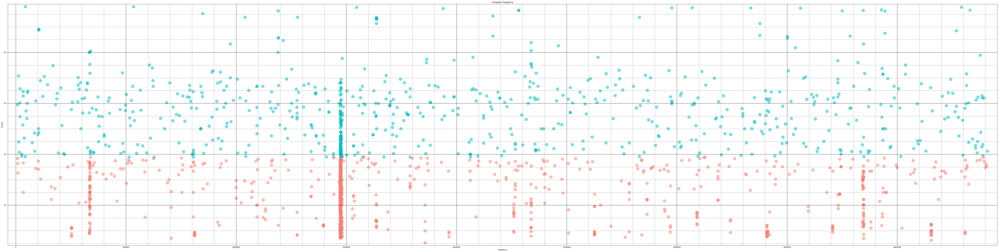

2_df


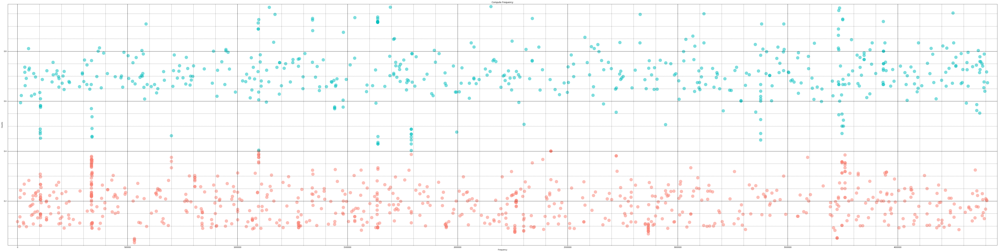

3_df


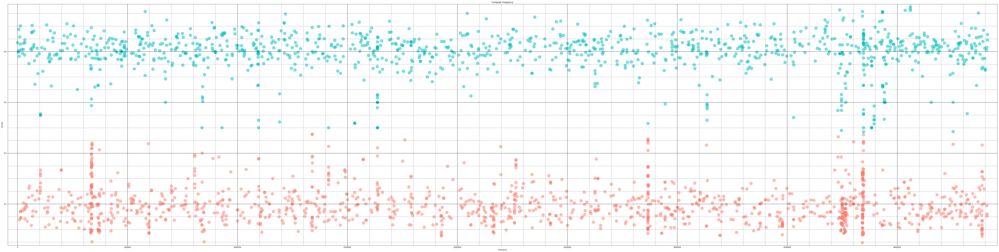

4_df


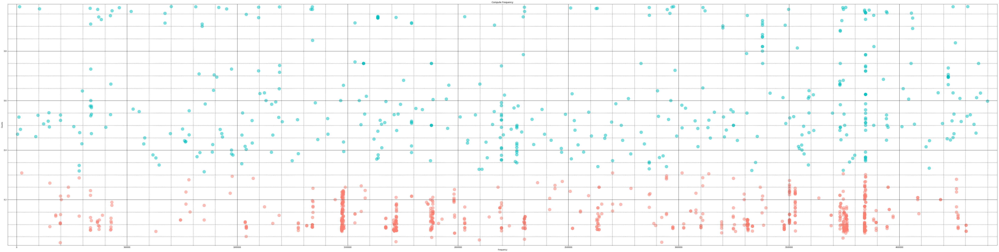

5_df


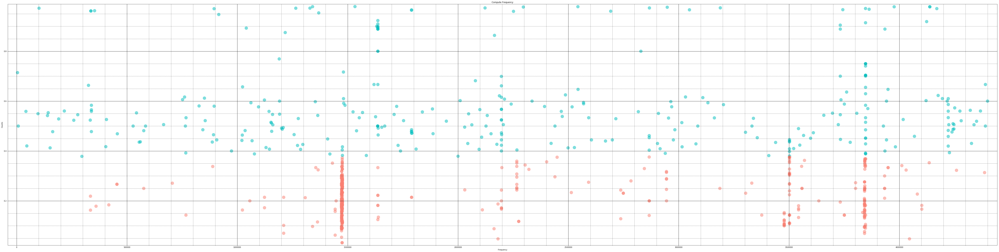

In [60]:
for name_df, df in dict_df.items():
    print(name_df)
    scatter_vcf_pos(df)

1_df_nr


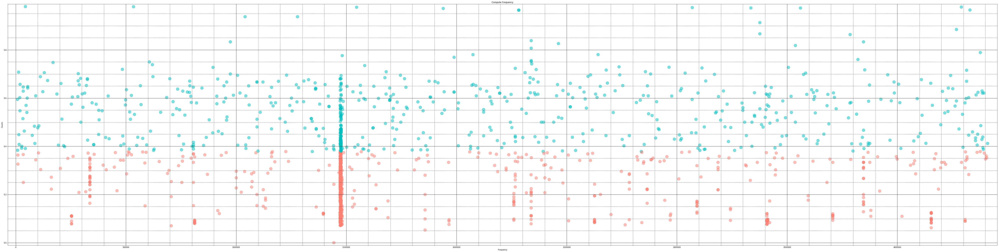

2_df_nr


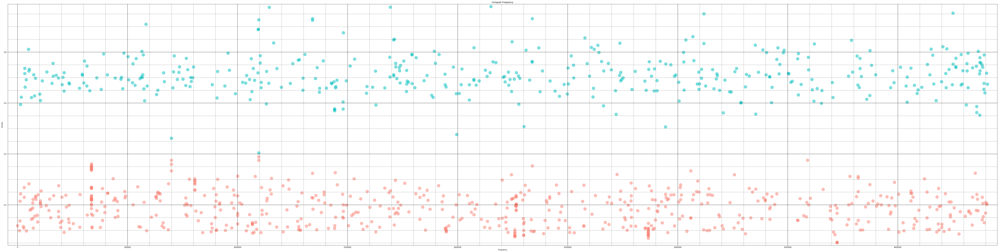

3_df_nr


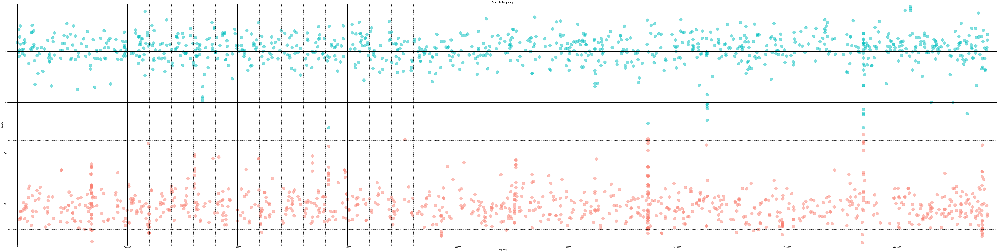

4_df_nr


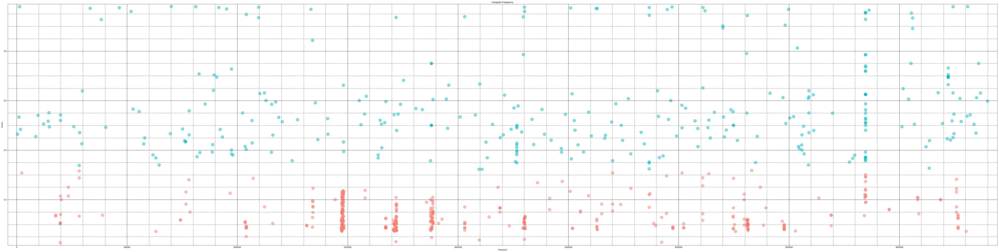

5_df_nr


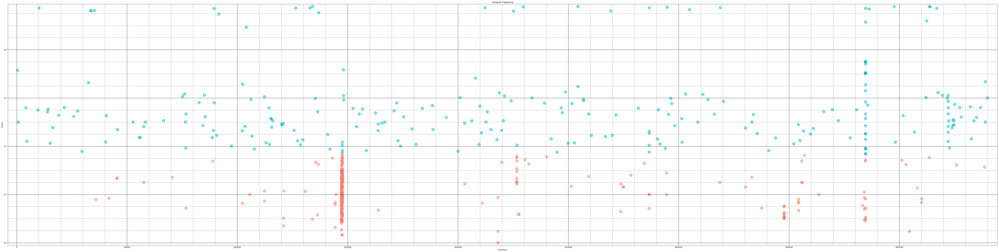

In [31]:
for name_nr, df_nr in dict_nr.items():
    print(name_nr)
    scatter_vcf_pos(df_nr)

In [32]:
print(dict_nr["2_df_nr"].loc[1002,'POS'])

2870386.0


In [33]:
def add_snp_distance(vcf_df):
    for index in vcf_df.index.values:
        if index > 0:
            vcf_df.loc[index,'snp_left_distance'] = vcf_df.loc[index,'POS'] - vcf_df.loc[index - 1,'POS']
        if index < (len(vcf_df.index.values) - 1):
            vcf_df.loc[index,'snp_right_distance'] = vcf_df.loc[index + 1,'POS'] - vcf_df.loc[index,'POS']
            
    return vcf_df

In [34]:
#P190_df_nr[P190_df_nr.isnull().any(axis=1)]

In [35]:
#Add distance to nr dataframes
#dict_dist = {}
for name_nr, df_nr in dict_nr.items():
    #name = name_nr + "_ds"
    dict_nr[name_nr] = add_snp_distance(df_nr)

In [36]:
dict_nr["1_df_nr"].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,...,PGT,PID,PS,REF_AD,ALT_AD,aF,AF,Is_repeat,snp_right_distance,snp_left_distance
0,MTB_anc,2532.0,.,C,T,921.03,PASS,AC=2;AF=1.00;AN=2;DP=29;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,29:29:87:935,87,0",...,NaN,NaN,NaN,0.0,29.0,0.000000,1.000000,False,5517.0,NaN
1,MTB_anc,8049.0,.,T,G,1319.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.873;DP=74;Ex...,GT:AD:DP:GQ:PL,"0/1:30,44:74:99:1327,0,793",...,NaN,NaN,NaN,30.0,44.0,0.405405,0.594595,False,639.0,5517.0
2,MTB_anc,8688.0,.,G,T,784.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.87;DP=73;Exc...,GT:AD:DP:GQ:PL,"0/1:45,28:73:99:792,0,1301",...,NaN,NaN,NaN,45.0,28.0,0.616438,0.383562,False,455.0,639.0
3,MTB_anc,9143.0,.,C,T,3478.03,PASS,AC=2;AF=1.00;AN=2;DP=106;ExcessHet=3.0103;FS=0...,GT:AD:DP:GQ:PL,"1/1:0,106:106:99:3492,318,0",...,NaN,NaN,NaN,0.0,106.0,0.000000,1.000000,False,698.0,455.0
4,MTB_anc,9841.0,.,C,T,1034.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.148;DP=121;E...,GT:AD:DP:GQ:PL,"0/1:77,44:121:99:1042,0,2063",...,NaN,NaN,NaN,77.0,44.0,0.636364,0.363636,False,103.0,698.0


In [37]:
def filter_by_distance(vcf_dist_df, distance):
    vcf_df_filtered_distance = vcf_dist_df[((vcf_dist_df['snp_right_distance'] > distance) | (vcf_dist_df['snp_left_distance'] > distance))]
    return vcf_df_filtered_distance

In [38]:
dict_dsf = {}
for name_nr, df_nr in dict_nr.items():
    name_dsf = name_nr + "_dsf"
    dict_dsf[name_dsf] = filter_by_distance(df_nr, 1500)

In [39]:
for i in dict_dsf:
    print(i)

1_df_nr_dsf
2_df_nr_dsf
3_df_nr_dsf
4_df_nr_dsf
5_df_nr_dsf


In [40]:
print(dict_nr["1_df_nr"].shape)
print(dict_dsf["1_df_nr_dsf"].shape)

(1956, 38)
(1095, 38)


In [41]:
dict_dsf["3_df_nr_dsf"]['AF'].describe()

count    1372.000000
mean        0.523654
std         0.315598
min         0.047619
25%         0.192951
50%         0.730435
75%         0.818182
max         1.000000
Name: AF, dtype: float64

1_df_nr_dsf


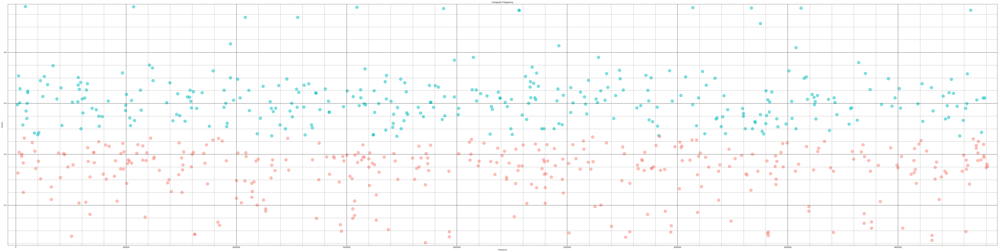

2_df_nr_dsf


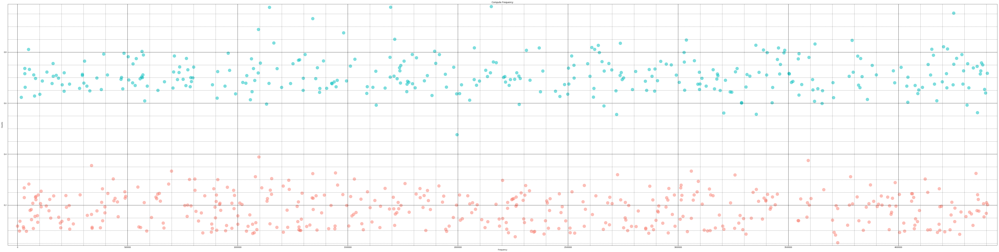

3_df_nr_dsf


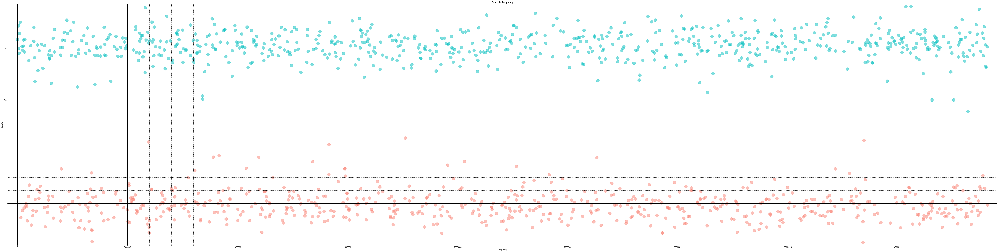

4_df_nr_dsf


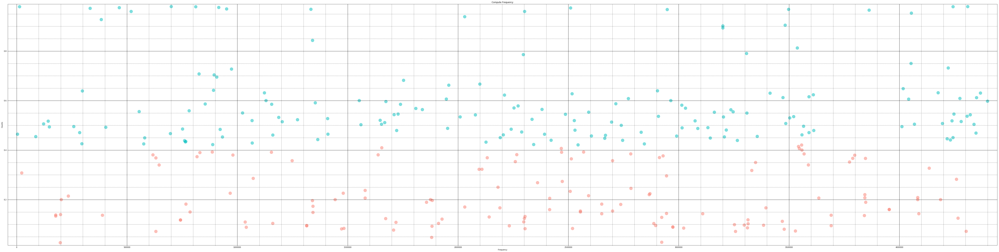

5_df_nr_dsf


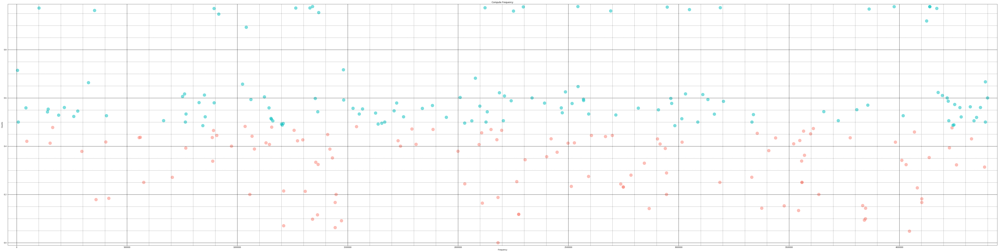

In [42]:
for name_dsf, df_dsf in dict_dsf.items():
    print(name_dsf)
    scatter_vcf_pos(df_dsf)

1_df_nr_dsf
2_df_nr_dsf
3_df_nr_dsf
4_df_nr_dsf
5_df_nr_dsf


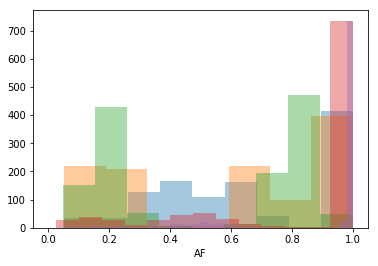

In [43]:
for name_dsf, df_dsf in dict_dsf.items():
    print(name_dsf)
    x = df_dsf['AF']
    sns.distplot(x, kde=False, rug=False)

1_df_nr_dsf


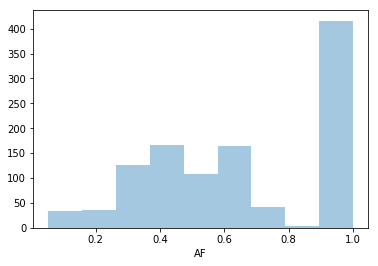

2_df_nr_dsf


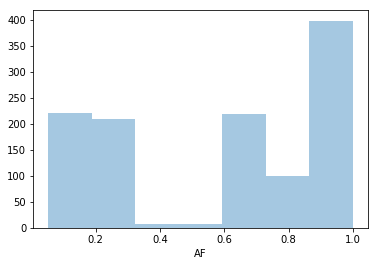

3_df_nr_dsf


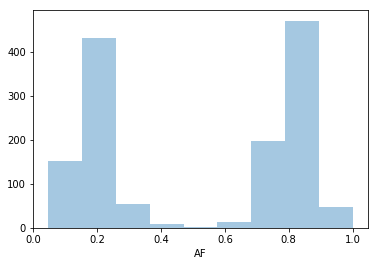

4_df_nr_dsf


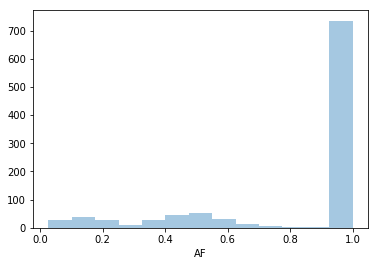

5_df_nr_dsf


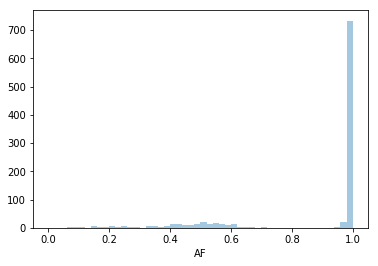

In [44]:
for name_dsf, df_dsf in dict_dsf.items():
    print(name_dsf)
    distplot_sns(df_dsf)

# Extract Population Frequency by Allele Frequency

In [45]:
def split_sample_freq(vcf_df):
    filter_homoz_top = 0.95
    filter_homoz_bottom = (1 - filter_homoz_top)
    mean = vcf_df['AF'][(vcf_df['AF'] < filter_homoz_top) & (vcf_df['AF'] > filter_homoz_bottom)].mean(axis = 0)
    top_positions = vcf_df[(vcf_df['AF'] > mean) & (vcf_df['AF'] < filter_homoz_top)]
    top_positions_mean = top_positions['AF'].mean(axis = 0)
    bottom_positions = vcf_df[(vcf_df['AF'] < mean) & (vcf_df['AF'] > filter_homoz_bottom)]
    bottom_positions_mean = bottom_positions['AF'].mean(axis = 0)
    print("TOP: %s, BTM: %s" % (top_positions_mean, bottom_positions_mean))
    return #top_positions_mean, bottom_positions_mean

In [46]:
for name_dsf, df_dsf in dict_dsf.items():
    print(name_dsf)
    split_sample_freq(df_dsf)

1_df_nr_dsf
TOP: 0.6050908433226194, BTM: 0.33014989056454885
2_df_nr_dsf
TOP: 0.7063357630724028, BTM: 0.1835753787661007
3_df_nr_dsf
TOP: 0.8100498290284974, BTM: 0.19353306432928166
4_df_nr_dsf
TOP: 0.5432889171558026, BTM: 0.20139929615751778
5_df_nr_dsf
TOP: 0.5507080941743161, BTM: 0.2996763517266037


In [ ]:
##################################################################################################################

# Extract position by Allele Frequency

In [50]:
def split_df_mean(vcf_df):
    filter_homoz = 0.98
    mean = vcf_df['AF'][vcf_df['AF'] < filter_homoz].mean(axis = 0)
    top_positions = vcf_df['POS'][(vcf_df['AF'] > mean) & (vcf_df['AF'] < filter_homoz)].tolist()
    bottom_positions = vcf_df['POS'][vcf_df['AF'] < mean].tolist()
    return top_positions, bottom_positions

# S = Somoza

In [51]:
S_file = "data/SOMOZACOL2_S11_L001__final.bam.snp.final"
S_final = import_to_pandas(S_file)
S_pos = set(S_final.loc[:,0].tolist())

In [52]:
top_P180, btm_P180 = split_df_mean(PAIR180_dsf)
top_P190, btm_P190 = split_df_mean(PAIR190_dsf)
top_P150, btm_P150 = split_df_mean(PAIR150_dsf)


In [53]:
print(len(top_P180))
print(len(btm_P180))
top_P180_set = set(top_P180)
btm_P180_set = set(btm_P180)

407
469


In [54]:
print(len(top_P190))
print(len(btm_P190))
top_P190_set = set(top_P190)
btm_P190_set = set(btm_P190)

388
516


In [55]:
print(len(top_P150))
print(len(btm_P150))
top_P150_set = set(top_P150)
btm_P150_set = set(btm_P150)

385
541


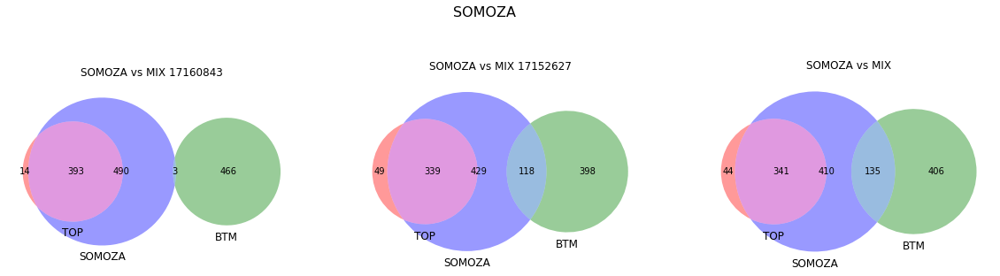

In [56]:
#Ven diagram with all (non exclusive snps in SOMOZA)
# P50 - 17171479
# P80 - 17160843
# P90 - 17152627

plt.figure(figsize=(20,5))

plt.subplot(1, 3, 1)
plt.title("SOMOZA vs MIX 17160843")
v3 = venn3([top_P180_set, btm_P180_set, S_pos], set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.subplot(1, 3, 2)
plt.title("SOMOZA vs MIX 17152627")
v = venn3([top_P190_set, btm_P190_set, S_pos], set_labels = ('TOP', 'BTM', 'SOMOZA'), )
#c = venn3_circles([top_P190_set, btm_P190_set, B_exclusive], linestyle='dashed', linewidth=1, color="grey")

plt.subplot(1, 3, 3)
plt.title("SOMOZA vs MIX")
v2 = venn3([top_P150_set, btm_P150_set, S_pos], set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.suptitle('SOMOZA', fontsize=16, verticalalignment='bottom')

plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")
#plt.show()

In [57]:
def split_df_mean_todict(vcf_df):
    mean = vcf_df['AF'][vcf_df['AF'] < 1].mean(axis = 0)
    top_positions = vcf_df[(vcf_df['AF'] > mean) & (vcf_df['AF'] < 1)]
    top_positions_dict = top_positions.set_index('POS')['ALT'].to_dict()
    bottom_positions = vcf_df[vcf_df['AF'] < mean]
    bottom_positions_dict = bottom_positions.set_index('POS')['ALT'].to_dict()
    return top_positions_dict, bottom_positions_dict

In [58]:
PAIR180_dsf.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,DP,AF,SB,DP4,Fref,Rref,Fsample,Rsample,Is_repeat,snp_right_distance,snp_left_distance
0,MTB_anc,2532,.,C,T,910,PASS,"DP=29;AF=0.965517;SB=0;DP4=0,0,17,11",29.0,0.965517,0.0,"0,0,17,11",0.0,0.0,17.0,11.0,False,3608.0,NaN
1,MTB_anc,6140,.,G,T,1346,PASS,"DP=75;AF=0.586667;SB=0;DP4=17,14,22,22",75.0,0.586667,0.0,"17,14,22,22",17.0,14.0,22.0,22.0,False,3003.0,3608.0
2,MTB_anc,9143,.,C,T,2304,PASS,"DP=67;AF=0.985075;SB=3;DP4=0,1,39,27",67.0,0.985075,3.0,"0,1,39,27",0.0,1.0,39.0,27.0,False,2227.0,3003.0
3,MTB_anc,11370,.,C,T,778,PASS,"DP=80;AF=0.362500;SB=3;DP4=23,28,16,13",80.0,0.362500,3.0,"23,28,16,13",23.0,28.0,16.0,13.0,False,55.0,2227.0
4,MTB_anc,11425,.,A,C,89,PASS,"DP=86;AF=0.104651;SB=34;DP4=48,29,0,9",86.0,0.104651,34.0,"48,29,0,9",48.0,29.0,0.0,9.0,False,2035.0,55.0


In [59]:
PAIR180_dict = PAIR180_dsf.set_index('POS')['ALT'].to_dict()
PAIR190_dict = PAIR190_dsf.set_index('POS')['ALT'].to_dict()
PAIR150_dict = PAIR150_dsf.set_index('POS')['ALT'].to_dict()

In [60]:
get_lineage_coll(PAIR180_dict)
get_lineage_coll(PAIR190_dict)
get_lineage_coll(PAIR150_dict)

This samples belongs to linage 4
This samples belongs to linage 4
This samples belongs to linage 4


'4'

In [61]:
top_P180_dict, btm_P180_dict = split_df_mean_todict(PAIR180_dsf)
top_P190_dict, btm_P190_dict = split_df_mean_todict(PAIR190_dsf)
top_P150_dict, btm_P150_dict = split_df_mean_todict(PAIR150_dsf)

In [62]:
get_lineage_coll(top_P180_dict)
get_lineage_coll(top_P190_dict)
get_lineage_coll(top_P150_dict)
get_lineage_coll(btm_P180_dict)
get_lineage_coll(btm_P190_dict)
get_lineage_coll(btm_P150_dict)

This samples belongs to linage unknown
This samples belongs to linage unknown
This samples belongs to linage unknown
This samples belongs to linage unknown
This samples belongs to linage unknown
This samples belongs to linage unknown


'unknown'

In [63]:
get_resistance_snp(PAIR180_dict)
get_resistance_snp(PAIR190_dict)
get_resistance_snp(PAIR150_dict)

This strain has those resistance positions:rifampicin_(RMP)
This strain has those resistance positions:rifampicin_(RMP)
This strain has those resistance positions:rifampicin_(RMP)


['rifampicin_(RMP)']

In [64]:
get_resistance_snp(top_P180_dict)
get_resistance_snp(top_P190_dict)
get_resistance_snp(top_P150_dict)
get_resistance_snp(btm_P180_dict)
get_resistance_snp(btm_P190_dict)
get_resistance_snp(btm_P150_dict)

This strain has those resistance positions:rifampicin_(RMP)
This strain has those resistance positions:rifampicin_(RMP)
No resistance were found
No resistance were found
No resistance were found
This strain has those resistance positions:rifampicin_(RMP)


['rifampicin_(RMP)']